In [1]:
## use pegasus env ##

import glob
import gc
import random
from pathlib import Path

## monkey patch ##

import jax.numpy as jaxnp

if not hasattr(jaxnp, "trapezoid"):
    jaxnp.trapezoid = jaxnp.trapz

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc

import torch

import hnoca.snapseed as snap
from hnoca.snapseed.utils import read_yaml

import pegasus as pg
from pegasusio import UnimodalData

%matplotlib inline

sc.settings.n_jobs = 25

random.seed(0)
np.random.seed(0)
sc.settings.seed = 0

torch.set_float32_matmul_precision("high")

In [2]:
## PATH ##

path = Path('/mnt/sdb/scz_meta_analysis_processed/dge_signatures')

In [3]:
## Read In Data ##

adata = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/integrated_adata.h5ad')
adata_hvg = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/integrated_adata_hvg.h5ad', backed='r')

adata.obsm = adata_hvg.obsm.copy()
adata.obsp = adata_hvg.obsp.copy()
adata.uns = adata_hvg.uns.copy()

# collect memory
del adata_hvg
gc.collect()

# read in cluster identites from hierarchical_clustering_scVI  
cluster_identities = pd.read_csv(path / 'iterative_clustering_table_plus_missing_post_merge.csv', index_col=0)
del adata.obs['class']
adata.obs = adata.obs.merge(cluster_identities, left_index=True, right_index=True, how='left')

In [4]:
## Import DGE Data ##

# Read in the marker genes
marker_genes = read_yaml("/mnt/sdb/scz_meta_analysis_processed/models/hnoca_models/Data_S1_snapseed_markers.yaml")

# subclass dge lists
all_classes_df = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/scDGE_class_subclass.csv', index_col=0)

# subtype dge lists
all_subclasses = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/scDGE_subclass_subtype.csv', index_col=0)

# subclass specificity genes
subclass_cts = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/dreamlet_dges/one_vs_all/subclass/cellTypeSpecificity.csv',
                          index_col=0)

# subclass specificity genes
subtype_cts = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/dreamlet_dges/one_vs_all/subtype/cellTypeSpecificity.csv',
                          index_col=0)

In [5]:
## Snapseed Annotation ##

# HNOCA needs the name "class" and "subtype"
adata.obs.rename({'class':'cluster_level_1', 'subclass':'cluster_level_2', 'subtype':'cluster_level_3'}, axis=1, inplace=True)

# Annotate Levels 
adata.obs["cluster_level_3"] = adata.obs["cluster_level_3"].astype('str')
hierarchy_dict = snap.annotate_hierarchy(adata, marker_genes, group_name="cluster_level_3", layer="log1p_norm")

# Use Deepest Cluster
levels = ["level_1", "level_2", "level_3", "level_4", "level_5"]
hierarchy_dict['assignments']["deepest_label"] = hierarchy_dict['assignments'][levels].iloc[:, ::-1].bfill(axis=1).iloc[:, 0]
hierarchy_dict['assignments']['cluster'] = hierarchy_dict['assignments'].index

# merge in HHONCA Annotations #
adata.obs['barcodes'] = adata.obs.index
adata.obs = adata.obs.merge(hierarchy_dict['assignments'][['deepest_label', 'cluster']], how='left', left_on='cluster_level_3', right_on='cluster')
adata.obs['deepest_label'] = adata.obs['deepest_label'].astype('str')
adata.obs_names = adata.obs['barcodes'].astype('str')

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [6]:
## Map Identities by SCANVI to HNOCA Atlas ##

query_ref = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/adata_hnoca_scanvi_integrated.h5ad', backed='r')
hnoca_atlas_mapped_table = query_ref.obs[['origin', 'Pred_Celltype']].copy()
del query_ref
gc.collect()

adata.obs = adata.obs.merge(hnoca_atlas_mapped_table, left_index=True, right_index=True, how='left')

In [7]:
## Class #

class_dge_list = []
for file_path in glob.glob('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/dreamlet_dges/one_vs_all/class/DE_*'):
    dge = pd.read_csv(file_path, index_col=0)
    dge = dge[(dge['adj.P.Val'] < 0.05) & (dge['logFC'] > 1)].sort_values(by='AveExpr', ascending=False)
    class_dge_list.append(dge)

class_dges = pd.concat(class_dge_list, axis=0)

class_dges = class_dges[~pd.Series(class_dges.index).str.contains('ENSG').values]

In [8]:
## Subclass #

subclass_dge_list = []
for file_path in glob.glob('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/dreamlet_dges/one_vs_all/subclass/DE_*'):
    dge = pd.read_csv(file_path, index_col=0)
    dge = dge[(dge['adj.P.Val'] < 0.05) & (dge['logFC'] > 1)].sort_values(by='AveExpr', ascending=False)
    subclass_dge_list.append(dge)

subclass_dges = pd.concat(subclass_dge_list, axis=0)

subclass_dges = subclass_dges[~pd.Series(subclass_dges.index).str.contains('ENSG').values]

In [9]:
## Subtypes ##

subtype_dge_list = []
for file_path in glob.glob('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/dreamlet_dges/one_vs_all/subtypes_remerged/DE_*'):
    dge = pd.read_csv(file_path, index_col=0)
    dge = dge[(dge['adj.P.Val'] < 0.05) & (dge['logFC'] > 1)].sort_values(by='AveExpr', ascending=False)
    subtype_dge_list.append(dge)

subtypes_dges = pd.concat(subtype_dge_list, axis=0)

subtypes_dges = subtypes_dges[~pd.Series(subtypes_dges.index).str.contains('ENSG').values]

In [10]:
hvg_df = pd.DataFrame(data=adata[:,adata.var.highly_variable_features].X.toarray(),
             index=adata.obs_names,
             columns=adata[:,adata.var.highly_variable_features].var_names)

hvg_df['subtypes_remerged'] = adata.obs['subtypes_remerged']

hvg_pbd = hvg_df.groupby('subtypes_remerged').mean()

<Axes: ylabel='Count'>

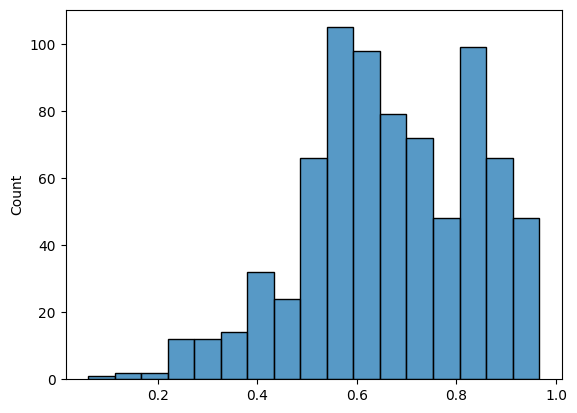

In [11]:
# Take upper triangle without diagonal and flatten
upper_tri = hvg_pbd.T.corr().where(np.triu(np.ones(hvg_pbd.T.corr().shape), k=1).astype(bool))
flat_corr = upper_tri.stack()  # drops NaNs automatically

sns.histplot(flat_corr)

In [12]:
# Compute the correlation matrix
corr_matrix = hvg_pbd.T.corr()

# Create a boolean mask for correlations > 0.95 (excluding 1.0 on the diagonal)
high_corr = (corr_matrix > 0.95) & (corr_matrix < 1.0)

# Find the pairs
high_corr_pairs = np.where(high_corr)

# Print the pairs and their correlation values
for i, j in zip(*high_corr_pairs):
    print(f"{corr_matrix.index[i]} and {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]}")

1_1_1 and 1_1_1_3: 0.9520453478830445
1_1_1_3 and 1_1_1: 0.9520453478830445
1_3_1 and 1_3_3: 0.9580173702504262
1_3_3 and 1_3_1: 0.9580173702504262
2_1_1 and 2_3_2: 0.9515301188580664
2_1_2 and 2_1_2_2: 0.9659575635533434
2_1_2_2 and 2_1_2: 0.9659575635533434
2_2_1 and 2_3_1: 0.9658475979059149
2_2_4 and 2_3_3: 0.9565214270931514
2_3_1 and 2_2_1: 0.9658475979059149
2_3_2 and 2_1_1: 0.9515301188580664
2_3_3 and 2_2_4: 0.9565214270931514
2_4_1 and 2_4_2: 0.9572616363916482
2_4_2 and 2_4_1: 0.9572616363916482


In [13]:
# 211 is like 232 because both deep layer
# 221 is like 231 but both poorly typed 221 is hindbrain and 231 upper layer... check that it applies to the 231 subtype
# 224 is like 233 beause one ins cerebellar other is pontine but both inhibitory
# 232 is like 211
# 241 is like 242 beacuse both CGE interneurons

In [14]:
hvg_pbd.T.corr()['1_3_3'].nlargest(20)

subtypes_remerged
1_3_3      1.000000
1_3_1      0.958017
1_3_2      0.941052
1_2_3      0.919528
1_1_3      0.916085
1_1_5      0.909797
1_2_1      0.898136
1_3_4      0.878982
1_2_4      0.872304
1_2_2      0.871528
1_2_5      0.862125
1_4_1      0.856245
1_1_4      0.843838
1_4_4      0.832531
1_1_1      0.814570
1_1_2      0.812426
1_1_1_3    0.763045
1_1_6      0.754265
2_1_2      0.733636
2_1_2_2    0.727604
Name: 1_3_3, dtype: float64

In [15]:
hnoca_markers = ['SOX2', 'VIM', 'NES', 'FOXG1', 'EMX1', 'HOPX', 'GABRA2', 'GABRB1', 'DLX2', 
                 'TCF7L2', 'SIX3', 'OTX2', 'PAX7', 'VSX2', 'CYP26A1', 'HOXA2', 'HOXB2', 'UNC5C', 
                 'BCAN', 'GPC6', 'HOXD3', 'HOXA3', 'STMN2', 'DCX', 'SLC17A7', 'SLC17A6', 'BCL11B',
                 'SATB2', 'PITX2', 'BARHL2', 'TFAP2D', 'TFAP2A', 'UNCX', 'INSM1', 'ROBO1', 'NEGR1',
                 'GAD1', 'GAD2', 'SLC32A1', 'DLX5', 'NKX2-1', 'ISL1', 'NR2F1', 'LHX5', 'LHX1', 
                 'CA8', 'LAMP5', 'SKOR2', 'AQP4', 'GFAP', 'TTR', 'OLIG1', 'MBP', 'AIF1', 'CLDN5', 'DCN', 'SOX10', 'PRPH']

hnoca_subtype_dge = subtypes_dges[pd.Series(subtypes_dges.index).isin(hnoca_markers).values]  

hnoca_subtype_dge[hnoca_subtype_dge['subtype'] == '1_2_3'].sort_values(by='B', ascending=False)

,logFC,AveExpr,t,P.Value,adj.P.Val,B,subtype
UNC5C,1.020328,1.826885,5.827444,1.016296e-08,5.730730e-08,9.299794,1_2_3
PAX7,1.430725,2.528986,5.257429,2.178407e-07,9.677283e-07,6.281950,1_2_3
EMX1,1.040410,2.481994,3.454219,5.993709e-04,1.375103e-03,-1.228674,1_2_3


In [16]:
# Class 1 -  VIM TUBA1B IGFBP2 PTN MDK - glia

# 1_1 - SOX2 VIM FABP7 AQP4 FGF1 NES - radial glia (contains tRG, oligos, astrocytes)
# 1_2 - SOX2 TUBA1B H2AZ1 H4C3 HMGB1 HES6 TOP2A
# 1_3 - FABP7 ID4 SFRP1 HES1 HES5 PAX6 - radial glia - similar to 1_1 without CRYAB (CRYAB is weak) and with PAX6
# 1_4 - VIM VCAN SPARC CALD1 ITGB1 TPM1 TPM4 - mesenchymal cells?
# 1_5 - HLA-A B2M PSME1 FTH1 FTL GLUL S100A11 S100A10 S100A6 B2M HLA-B FTL JUNB JAK - stressed Mesenchymal Cell

# Class 2 -  TUBA1A SOX4 STMN1 MAP1B SOX11 GAP43 MAP2 DCX STMN2 SYT1 MAPT NRXN1 - neurons

# 2_1 - HES6 FOXG1 EMX2 EMX1 NEUROG1 ZBTB18 IGFBP5 FOXG1 LINC01551 #dorsal forebrain neuron
# 2_2 - NR2F2 PBX3 PPP1R1A LRRC4C LHX1 # hindbrain neuron
# 2_3 - FGF12 FAT3 GRIN2B CAMK2B LY6H GRIA4 # mixed neurons, unclear region, bound by synaptic phenotypes
# 2_4 - BCL11B NRXN3 FOXG1 GAD1 ARX GAD2 C11orf96 CALB2 CCDC88A MIR9-1HG QKI ZNF7040 SOX2 # GABAergic neurons

subclass_annotations_markers = {"1_1": "Radial Glia SOX2+VIM+FABP7+",
                                "1_2": "Proliferative Radial Glia SOX2+HES6+TOP2A+",
                                "1_3": "Radial Glia SOX2+PAX6+FABP7+",
                                "1_4": "Mesenchymal-like cells VIM+VCAN+SPARC+",
                                "1_5": "Stressed Glia FTL+B2M+GLUL+",
                                "2_1": "Dorsal Forebrain Neuron FOXG1+EMX1+NEUROG1+",
                                "2_2": "Hindbrain Neurons NR2F2+PBX3+LHX1+",
                                "2_3": "Mixed Neurons FGF12+GRIN2B+CAMK2B+",
                                "2_4": "GABAergic GAD1+GAD2+CALB2+"}

subclass_annotations = {"1_1": "Radial Glia",
                        "1_2": "Proliferative Radial Glia",
                        "1_3": "Radial Glia",
                        "1_4": "Mesenchymal-like cells",
                        "1_5": "Stressed Glia",
                        "2_1": "Dorsal Forebrain EN",
                        "2_2": "Hindbrain Neurons",
                        "2_3": "Mixed Neurons",
                        "2_4": "GABAergic"}

In [17]:
# 1_1 - SOX2 VIM FABP7 AQP4 FGF1 NES - radial glia (contains tRG, oligos, astrocytes)

# 1_1_1 - PTN FABP7 TAGLN2 HOPX SPARC IGFBP5 NFIA RSPO3 TRH TTR FAM107A RSPO2 AQP4 RSPO1 OTX2 WNT2B KRT8 KRT18 KRT19 TNC - RG -> CP
# 1_1_1_3 - GFAP, HOPX, AQP4, FABP7, HEPACAM, KCNJ10, SLC01C1 PTPRZ1 FAM107A MOXD1 - astrocytes
# 1_1_2 - FTL EIF1 SLC3A2 GDF15 PIM3 PPP1R15A HSPA6 PHLDA2 - stressed RG
# 1_1_3 - FZD10 NEUROG2 TFAP2B LHX1 PAX7 TFAP2A IRX3 HES6 SOX11 DCX - hypothalamic progenitor (closest to 2_2_2 which is probably hypothalmic)
# 1_1_4 - PTGDS CA12 NTKR2 EDNRB PTPRZ1 - glioblast
# 1_1_4_4 - OLIG1 OLIG2 PDGFRA SEMA5a-mid PTPRZ1 - OPC
# 1_1_4_11 - OLIG1 OLIG2 PDGFRA MBP PLP1 SEMA5A-hi - Oligodendrocyte
# 1_1_5 - FABP7 OLIG1 OLIG2 BCAN PMP2 SEMA5A-lo DLX1 DLX2 EGFR NPY GSX2 PTPRZ1 - canonical radial glia
# 1_1_6 - RELN NEUROD1 COL21A1 LHX1 COL25A1 CBLN1 RBFOX3 HES6 SOX11 STMN2 GAP43 DCX - neurogenic RG

# 1_2 - SOX2 TUBA1B H2AZ1 H4C3 HMGB1 HES6 TOP2A - proliferating radial glia (mostly G2M)

# 1_2_1 - TYMS GINS2 PCLAF CKS1B - unspecified S-phase proliferating RG cluster 
# 1_2_2 - GAD2 DLX1 DLX2 DLX5 OLIG1 GSX2 CALB2 MYT1 MKI67 TOP2A CDK1 EOMES S100B PDGFRA PTGDS BCAN - proliferating ventral forebrain RG
# 1_2_3 - CNTNAP3 CNTNAP3B CHRNA7 NTF3 TRPC3 - canonical/primed RG (for dorsal forebrain cluster like 2_1_2 and EOMES 2_1_2_2)
# 1_2_4 - CCNB1 CCNB2, CDC20, PLK1, AURKA, BUB1 - unspecified M-phase proliferating RG-cluster 
# 1_2_5 - LHX1 MYT1L NEUROD6 NEUROD2 STMN2 STMN2 TFAP2B TFAP2A SYT5 GRIA2 CAMK2B CNTN2 GRIN2B RBFOX3 TFAP2A - primed RG (unknown region)
          #most similarcluster is 2_2_2 hypothalamic neurons but no real hypothalmic markers

# 1_3 - FABP7 ID4 SFRP1 HES1 HES5 PAX6 - radial glia - similar to 1_1 without CRYAB (CRYAB is weak) and with PAX6

# 1_3_1 - ELAVL4 NEUROG1 NEUROG1 NEUROG2 DLL1 MFNG - dorsal forebrain RGs (described by Kriegstein)
# 1_3_2 - TTR RSPO2 OTX2 BMP2 - choroid plexus primed RG
# 1_3_3 - E2F1 PCNA MCM5 HELLS - proliferating dorsal forebrain RGs # correation >.95% with 1_3_1 - id remerge iwth 1_3_1
# 1_3_4 - HOPX FOXG1 EMX1 FAM107A LHX2 FABP7 FZD8 TNC NPY TFAP2C PTPRZ1 MOXD1 - outer dorsal radial glia (textbook from RG)
# vRGs might be in here 

# 1_4 - VIM VCAN SPARC CALD1 ITGB1 TPM1 TPM4 - mesenchymal cells?

# 1_4_1 - SIX1 ELAVL4 TAGLN3 DCX STMN2 STMN4 RFX4 - Neurogenic RGs (probably dorsal forebrain RGs) not MC
# 1_4_2 - FBXO2 PARD6B KRT18 KRT8 TNNT1 TNNT1 TNNC1 - Mixed skin and muscle
# 1_4_3 - PDGFRB COL6A3 COL6A1 COL6A2 COL5A1 COL14A1 - Fibroblast
# 1_4_4 - S100B MPZ SOX10 PLP1 ERBB3 EDNRB CD19 - Schwann Cells (Neural Crest Derived)

# 1_5 - HLA-A B2M PSME1 FTH1 FTL GLUL - reactive glial cell (probably astrocyte) JAK JUNB too

# Class 2 -  TUBA1A SOX4 STMN1 MAP1B SOX11 GAP43 MAP2 DCX STMN2 SYT1 MAPT NRXN1 - neurons

# 2_1 - HES6 FOXG1 EMX2 EMX1 NEUROG1 ZBTB18 IGFBP5 FOXG1 LINC01551 #dorsal forebrain neuron

# 2_1_1 - BCL11B TBR1 GRIN2B FOXG1 GRIK3 - deep layer neurons
# 2_1_2 - PPP1R17 NEUROG1 NEUROD4 NEUROD1 LHX9 EBF1 EBF2 - newborn neuron (straight out from 2_1_2_2) before laminar
# 2_1_2_2 - EOMES NEUROG1 NEUROD4 HES5 PAX6 GLIS3 EMX2 NEUROG2 - IPC
# 2_1_3 - SATB2 CUX2 DLX1 DLX5 FOXG1 GAD2 DLX2 NEUROD6 NEUROD2 - upper layer neurons (Transitional)
# 2_1_4 - CDKN1A(p21) PMAIP1 TNFRSF12A DERL3 MT2A --> stressed dying neurons

# 2_2 - NR2F2 PBX3 PPP1R1A LRRC4C LHX1 LHX5 PAX3 PAX7 EN1 BARHL1 BARHL2 TLX3 SLC17A6 NEUROD1/D54 # excitatory midbrain/hindbrain neuron

# 2_2_1 - CNTNAP2 DKK3 WNT4 INSM1 PRPH UNCX CSPG5 CSPG5 CSPG5 ADCY2 SERPINI1 KCNC2 ASIC2 - regional? but synaptic maturity

          # SLC17A6 INSM1[cerebellar excitatory] PRPH [Pons/medulla neuron] UNCX[cerebellar excitatory]  
          # undefined non-telencephalic excaitory , probably more cerebellum-medulla

# 2_2_2 - TLX3 NEUROD4 IRX3 IRX5 PAX3 NMU RBP1 - Hypothalamic Neurons (Excitatory) IRX2+IRX3+NMU+'
# 2_2_3 - GPC6 BCAN NEGR1 DDIT3 ATF3 TRIB3 HRK PMAIP1 CRYAB IRF1 - Pons/Medulla (Excitatory) Stressed
# 2_2_4 - UNC5C UNCX TFAP2A CA8 LHX1 LHX5 GAD1 GAD2 SKOR1 - Cerebellar Inhibitory Neuron
# 2_2_5 - GRIA2 SYN3 NPIPB5 RGPD5 CCDC57 ANKRD36 GAD1 GAD2 - Unknown Neuron Possibly Inhibitory

# 2_3 - FGF12 FAT3 GRIN2B CAMK2B LY6H LY6H GRIA4 # mixed neurons, unclear region, bound by synaptic phenotypes

# 2_3_1 -  CALY CREG2 PPP2R2C SCG5 CNTN1 NEGR1 CSPG5 RPRM DACH2 MEF2C - synaptic cluster with unclear identity
# 2_3_2 - NEUROD6 NEUROD2 FEZF2 TBR1 BCL11B SLC17A7 FOXG1 MEIS2 EMX2 NEUROG2 - deep layer neuron (most correlated with 2_3_1)
# 2_3_3 - LHX1 LHX5 IRX1 IRX2 IRX5 SLC32A1 LAMP5 GPC6 NES ONECUT - pons/medulla inhibitor neuron

# 2_4 - BCL11B NRXN3 FOXG1 GAD1 ARX GAD2 C11orf96 CALB2 CCDC88A MIR9-1HG QKI ZNF7040 SOX2 # GABAergic neurons

# 2_4_1 - DLX6-AS1 PDZRN3 KITLG PRKCA PLS3 PROX1 ARL4C SOX6 CXCR4 TNR TCF4 NFIB NFIA NFIA ID2 - CGE Interneuron PROX1+NR2F2+
# 2_4_2 - NPY VIP GSX2 HES5 HES6 NOTCH1  NFIA SCGN DLX5 ETV1 - immature CGE interneuron NPY+VIP+HES5+
# 2_4_3 - CALB2 MEIS2 ERBB4 GRIN2B GRIA1 FGF13 SNAP25 SYNPR PACSIN1 - mature CGE neuron CALB2+MEIS2+ERBB4+
# 2_4_4 - SIX3 TLE4 ZNF503 ZFHX4 ZFHX3 TSHZ2 POU3F1 RBFOX1 OXP4 SYT5 SYT7 - mature MGE interneuron TLE4+SIX3+ZFHX4+


In [18]:
## Subtype Dictionaries ##

subtype_cluster_annotations_markers = {
    # 1_1 lineage
    "1_1_1": "CP-Primed RG TTR+FABP7+HOPX+",
    "1_1_1_3": "Astrocyte GFAP+AQP4+HOPX+",
    "1_1_2": "Stressed RG FTL+EIF1+GDF15+",
    "1_1_3": "Hypothalamic RG FZD10+NEUROG2+PAX7+",
    "1_1_4": "Glioblast PTGDS+CA12+EDNRB+",
    "1_1_4_4": "OPC OLIG1+OLIG2+PDGFRA+",
    "1_1_4_11": "Oligodendrocyte OLIG1+OLIG2+MBP+",
    "1_1_5": "RG FABP7+PTPRZ1+EGFR+",
    "1_1_6": "Primed RG RELN+NEUROD1+DCX+",

    # 1_2 lineage
    "1_2_1": "S-Phase RG TYMS+GINS2+PCLAF+",
    "1_2_2": "Ventral RG GAD2+S100B+PDGFRA+", 
    "1_2_3": "S-Phase Midbrain/Hindbrain RG SOX3+H4C9+EN2+",
    "1_2_4": "M-Phase RG CCNB1+CDC20+PLK1+",
    "1_2_5": "Non-Telencephalic RG LHX1+NEUROD6+GRIA2+",

    # 1_3 lineage
    "1_3_1": "Dorsal Forebrain RG NEUROG1+NEUROG2+DLL1+",
    "1_3_2": "Choroid Plexus Primed RG TTR+RSPO2+OTX2+",
    "1_3_3": "Proliferating Dorsal RG E2F1+PCNA+MCM5+", # most similar to 1_3_1 corr=0.958017, could remerge with 1_3_1
    "1_3_4": "oRG HOPX+FOXG1+EMX1+",

    # 1_4 lineage
    "1_4_1": "Neurogenic RG SIX1+DCX+STMN2+",
    "1_4_2": "Skin/Muscle-Like Cells KRT8+KRT18+TNNT1+",
    "1_4_3": "Fibroblast PDGFRB+COL6A1+COL1A2+",
    "1_4_4": "Schwann Cell S100B+SOX10+PLP1+",

    # 1_5 Stressed Glia
    "1_5": "Stressed Glia FTL+B2M+GLUL+",

    # 2_1 lineage
    "2_1_1": "Deep Layer Neuron BCL11B+TBR1+GRIN2B+",
    "2_1_2": "Newborn Neuron NEUROG1+NEUROD1+EBF1+",
    "2_1_2_2": "IPC EOMES+NEUROG2+PAX6+",
    "2_1_3": "Upper Layer Neuron Transitional SATB2+CUX2+DLX1+",
    "2_1_4": "Stressed Neuron CDKN1A+PMAIP1+TNFRSF12A+",

    # 2_2 lineage
    "2_2_1": "Hindbrain/Cerebellar EN CNTNAP2+INSM1+PRPH+",
    "2_2_2": "Hypothalamic EN TLX3+IRX3+PAX3+",
    "2_2_3": "Stressed Pons/Medulla Neuron DDIT3+ATF3+PMAIP1+",
    "2_2_4": "Cerebellar Inhibitory Neuron GAD1+GAD2+LHX1+",
    "2_2_5": "HindBrain/Cerebellar EN GRID2+GRIK2+GRIA2+",

    # 2_3 lineage
    "2_3_1": "Unknown Neuron CALY+MEF2C+CNTN1+",
    "2_3_2": "Deep Layer Neuron FEZF2+TBR1+BCL11B+",
    "2_3_3": "Hindbrain Inhibitory Neuron LHX1+SLC32A1+LAMP5+",

    # 2_4 lineage
    "2_4_1": "CGE Interneuron PROX1+NR2F2+CXCR4+",
    "2_4_2": "Immature CGE Interneuron NPY+VIP+HES5+",
    "2_4_3": "Mature CGE Interneuron CALB2+MEIS2+ERBB4+",
    "2_4_4": "Mature MGE Interneuron SIX3+TLE4+ZFHX4+"}

subtype_cluster_annotations = {
    # 1_1 lineage
    "1_1_1": "CP-Primed RG",
    "1_1_1_3": "Astrocyte",
    "1_1_2": "Stressed RG",
    "1_1_3": "Hypothalamic RG",
    "1_1_4": "Glioblast",
    "1_1_4_4": "OPC",
    "1_1_4_11": "Oligodendrocyte",
    "1_1_5": "RG",
    "1_1_6": "Primed RG",

    # 1_2 lineage
    "1_2_1": "S-Phase RG",
    "1_2_2": "Ventral RG", 
    "1_2_3": "S-Phase Midbrain/Hindbrain RG",
    "1_2_4": "M-Phase RG",
    "1_2_5": "Non-Telencephalic RG",

    # 1_3 lineage
    "1_3_1": "Dorsal Forebrain RG",
    "1_3_2": "Choroid Plexus Primed RG",
    "1_3_3": "Proliferating Dorsal RG",
    "1_3_4": "oRG",

    # 1_4 lineage
    "1_4_1": "Neurogenic RG",
    "1_4_2": "Skin/Muscle-Like Cells",
    "1_4_3": "Fibroblast",
    "1_4_4": "Schwann Cell",

    # 1_5 Stressed Glia
    "1_5": "Stressed Glia",

    # 2_1 lineage
    "2_1_1": "Deep Layer Neuron",
    "2_1_2": "Newborn Neuron",
    "2_1_2_2": "IPC",
    "2_1_3": "Upper Layer Neuron Transitional",
    "2_1_4": "Stressed Neuron",

    # 2_2 lineage
    "2_2_1": "Hindbrain/Cerebellar EN",
    "2_2_2": "Hypothalamic EN",
    "2_2_3": "Stressed Pons/Medulla Neuron",
    "2_2_4": "Cerebellar Inhibitory Neuron",
    "2_2_5": "Hindbrain/Cerebellar EN",

    # 2_3 lineage
    "2_3_1": "Unknown Neuron",
    "2_3_2": "Deep Layer Neuron",
    "2_3_3": "Hindbrain Inhibitory Neuron",

    # 2_4 lineage
    "2_4_1": "CGE Interneuron",
    "2_4_2": "Immature CGE Interneuron",
    "2_4_3": "Mature CGE Interneuron",
    "2_4_4": "Mature MGE Interneuron"}

In [19]:
## Annotate Clusters ##

## assign subclass markers 
adata.obs['subclass_annotations_markers'] = adata.obs['cluster_level_2'].apply(lambda x: subclass_annotations_markers[x])
adata.obs['subclass_annotations'] = adata.obs['cluster_level_2'].apply(lambda x: subclass_annotations[x])

## assign subtype markers
adata.obs['subtype_cluster_annotations_markers'] = adata.obs['subtypes_remerged'].apply(lambda x: subtype_cluster_annotations_markers[x])
adata.obs['subtype_cluster_annotations'] = adata.obs['subtypes_remerged'].apply(lambda x: subtype_cluster_annotations[x])

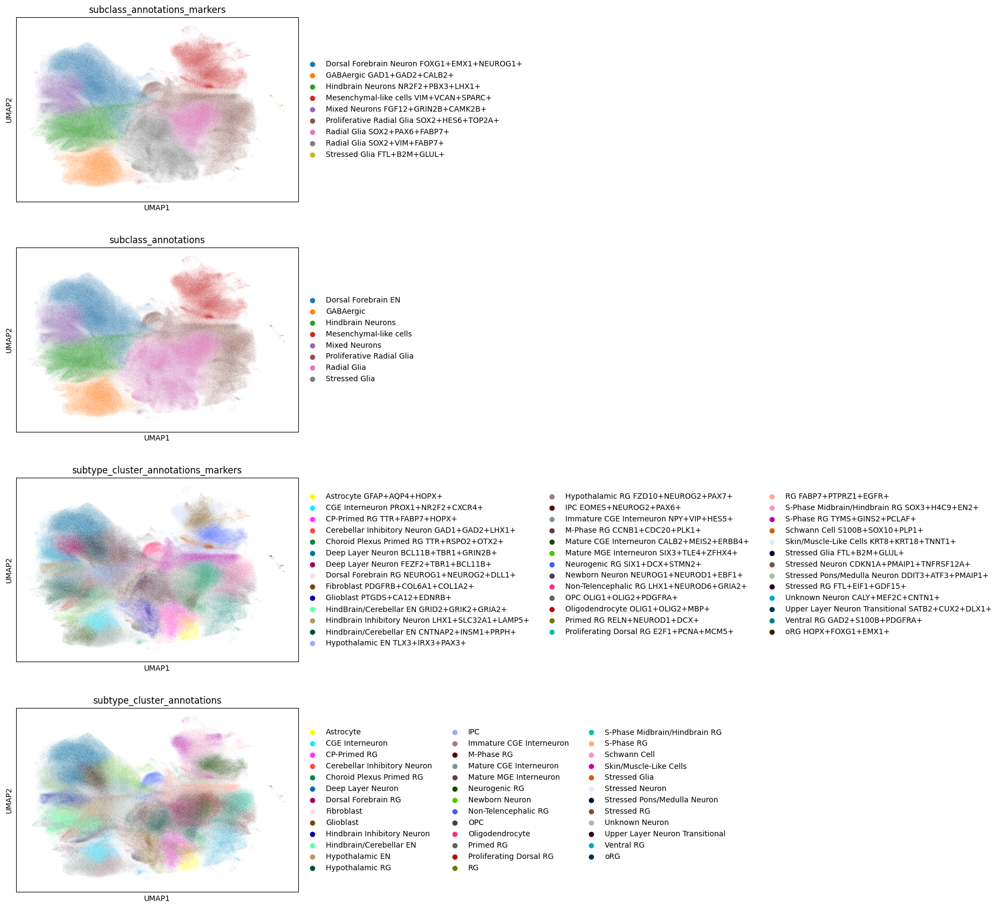

In [20]:
sc.pl.umap(adata, color=['subclass_annotations_markers', 
                         'subclass_annotations', 
                         'subtype_cluster_annotations_markers',
                         'subtype_cluster_annotations'], ncols=1)

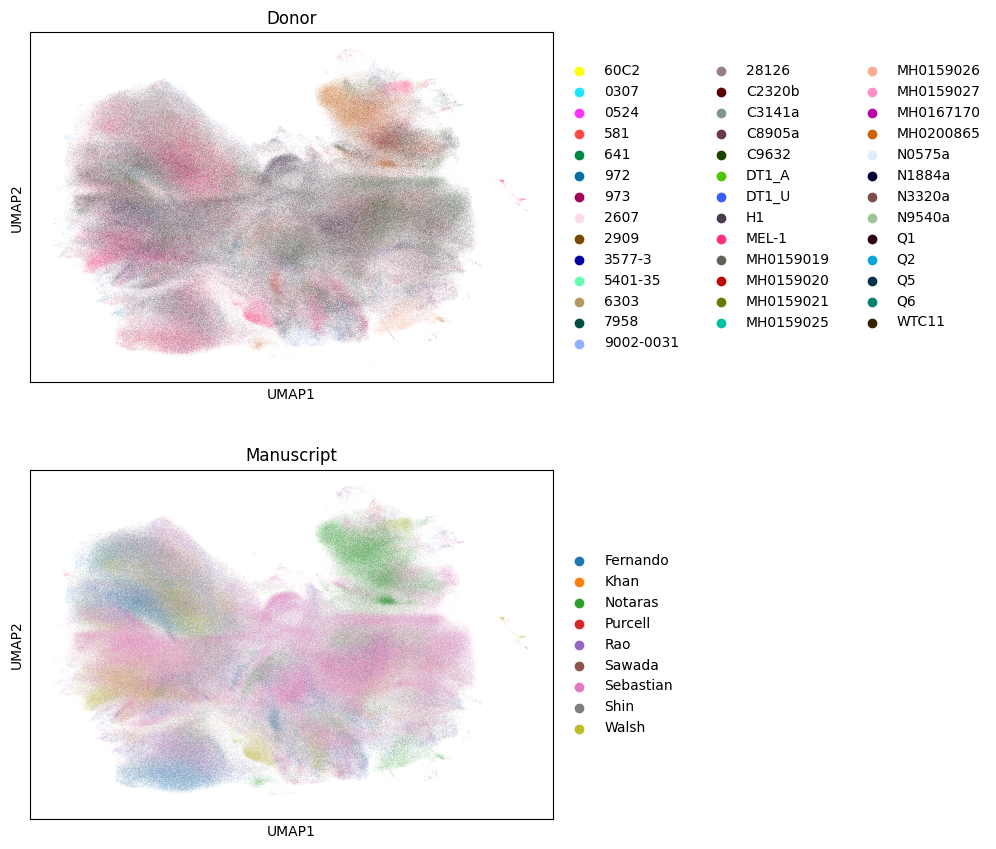

In [21]:
sc.pl.umap(adata, color=['Donor', 'Manuscript'], ncols=1)

In [22]:
## Doublet Estimation ##

if not isinstance(adata, UnimodalData):
    adata = UnimodalData(adata)

pg.infer_doublets(adata, channel_attr = 'Sample Name', clust_attr = 'subtypes_remerged', raw_mat_key='raw_counts', plot_hist=None) 

adata = adata.to_anndata()

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/pegasus/tools/doublet_detection.py:599: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  assert is_categorical_dtype(data.obs[channel_attr])


2026-04-12 14:49:07,142 - pegasus.tools.preprocessing - INFO - After filtration, 18684/19264 genes are kept. Among 18684 genes, 18396 genes are robust.
2026-04-12 14:49:07,142 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.28s.
2026-04-12 14:49:08,115 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.97s.
2026-04-12 14:49:08,139 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.02s.
2026-04-12 14:49:08,171 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2026-04-12 14:49:08,172 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.06s.
2026-04-12 14:49:12,278 - pegasus.tools.doublet_detection - INFO - Sample 3G2B-D50: doublet threshold = 0.2260; total cells = 5941; neotypic doublet rate in simulation = 25.21%; bimodality coefficient = 0.4444; neotypic doublet rate = 1.68%.
2026-04-12 14:49:12,279 - pegasus.too

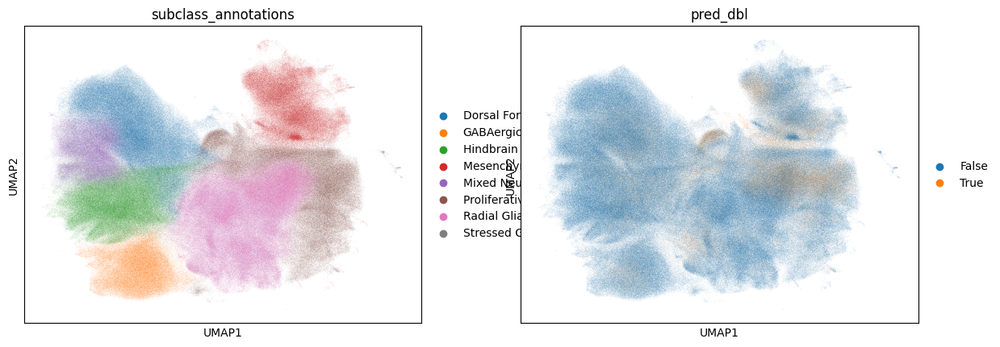

In [23]:
sc.pl.umap(adata, color=['subclass_annotations', 'pred_dbl'], ncols=2)

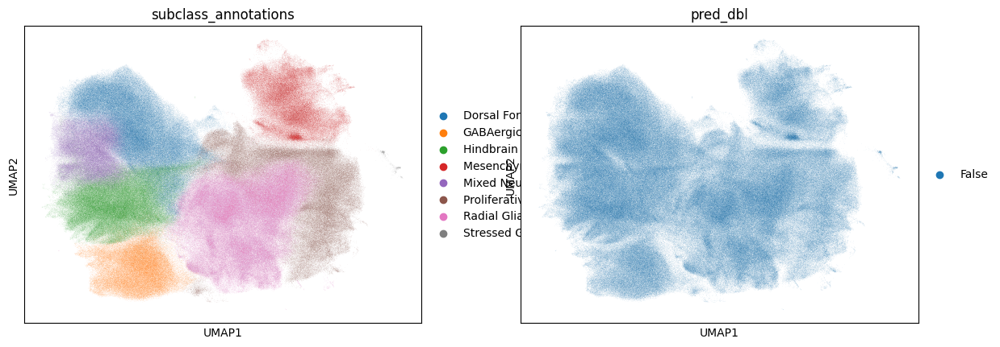

In [24]:
sc.pl.umap(adata[~adata.obs['pred_dbl']], color=['subclass_annotations', 'pred_dbl'], ncols=2)

In [25]:
## Doublet Counts ##

adata.obs['pred_dbl'].sum()

193755

In [26]:
subtypes_dges.loc[subtypes_dges.index.str.contains('^GRID2')].sort_values(by='logFC', ascending=False)

,logFC,AveExpr,t,P.Value,adj.P.Val,B,subtype
GRID2,1.803344,6.269271,11.423893,1.637390e-26,6.689527e-26,49.094593,2_2_5
GRID2,1.770578,5.777551,7.567647,4.383328e-13,5.368891e-12,19.002530,1_1_4_4
GRID2,1.351397,5.850273,9.116522,2.893093e-18,9.891868e-17,30.670306,1_1_4
GRID2,1.046821,5.199394,5.968774,8.190430e-09,8.499093e-08,9.508009,2_4_4


In [27]:
subclass_dges.loc[subclass_dges.index.str.contains('^GRID2')].sort_values(by='logFC', ascending=False)

,logFC,AveExpr,t,P.Value,adj.P.Val,B,subclass
GRID2,1.275885,4.563984,6.045153,7.147910e-09,3.013399e-07,9.725596,2_2


In [28]:
# subclass_dges[subclass_dges['subclass'] == '1_5'].sort_values(by='AveExpr', ascending=False)[0:40]

In [29]:
subtypes_dges[(subtypes_dges['subtype'] == '2_2_5') & (subtypes_dges['AveExpr'] > 5)].sort_values(by='logFC', ascending=False)[0:40]

,logFC,AveExpr,t,P.Value,adj.P.Val,B,subtype
GOLGA8A,2.404890,6.810737,17.250750,7.959597e-51,1.056958e-49,104.788112,2_2_5
GOLGA8B,2.234056,6.372436,19.982073,5.826253e-63,2.146229e-61,132.625219,2_2_5
LRP1B,2.125228,5.013055,14.178928,1.394722e-37,9.534330e-37,74.427505,2_2_5
ANKRD36,2.090025,6.283441,20.287266,2.526284e-64,1.181917e-62,135.752540,2_2_5
CCSER1,2.010472,6.028196,15.801807,1.695195e-44,1.628797e-43,90.273949,2_2_5
ANKRD36B,1.959894,5.816754,20.232968,4.415512e-64,1.998334e-62,135.195764,2_2_5
GRIA2,1.931349,8.505528,11.606817,3.260691e-27,1.378892e-26,50.748990,2_2_5
ANKRD36C,1.914514,6.840650,17.780022,3.668161e-53,5.656824e-52,110.147692,2_2_5
SLC4A10,1.866930,5.191615,15.071779,2.329053e-41,1.941694e-40,83.082862,2_2_5
CCDC171,1.842043,5.516393,16.522759,1.243780e-47,1.394442e-46,97.461439,2_2_5


/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


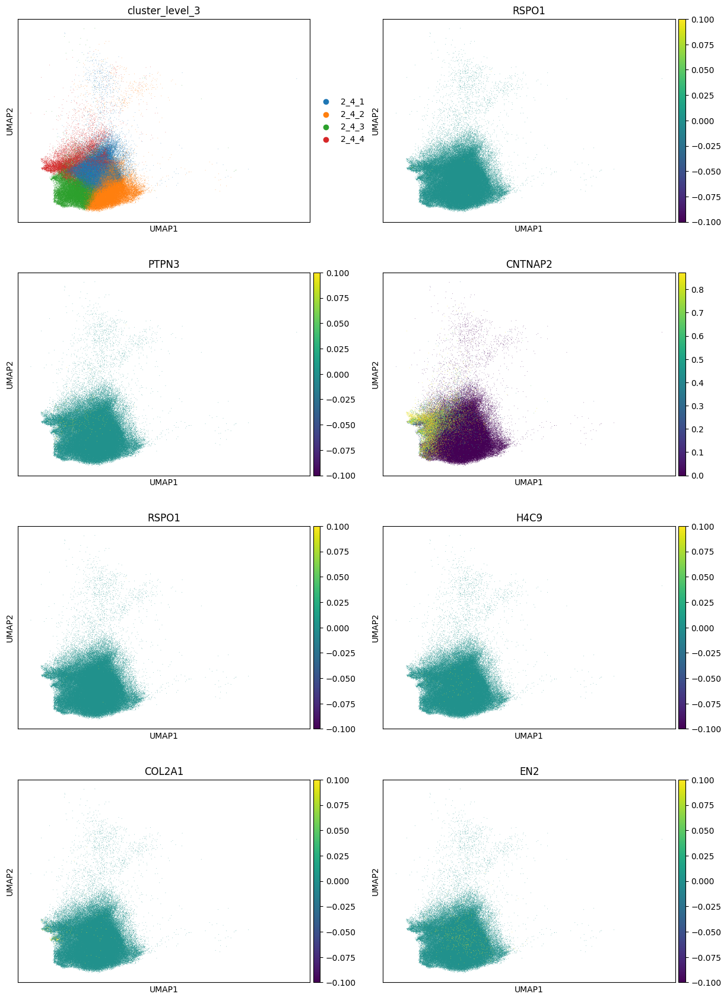

In [30]:
## Examine Subset of Genes in a Class ##
## Subclass ##

subclass_cluster = '2_4'

sc.pl.umap(adata[adata.obs['cluster_level_2'] == subclass_cluster],
           color='''cluster_level_3 RSPO1 PTPN3 CNTNAP2 RSPO1 H4C9 COL2A1 EN2'''.split(' '),
           layer='log1p_norm', vmax='p97', ncols=2)

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


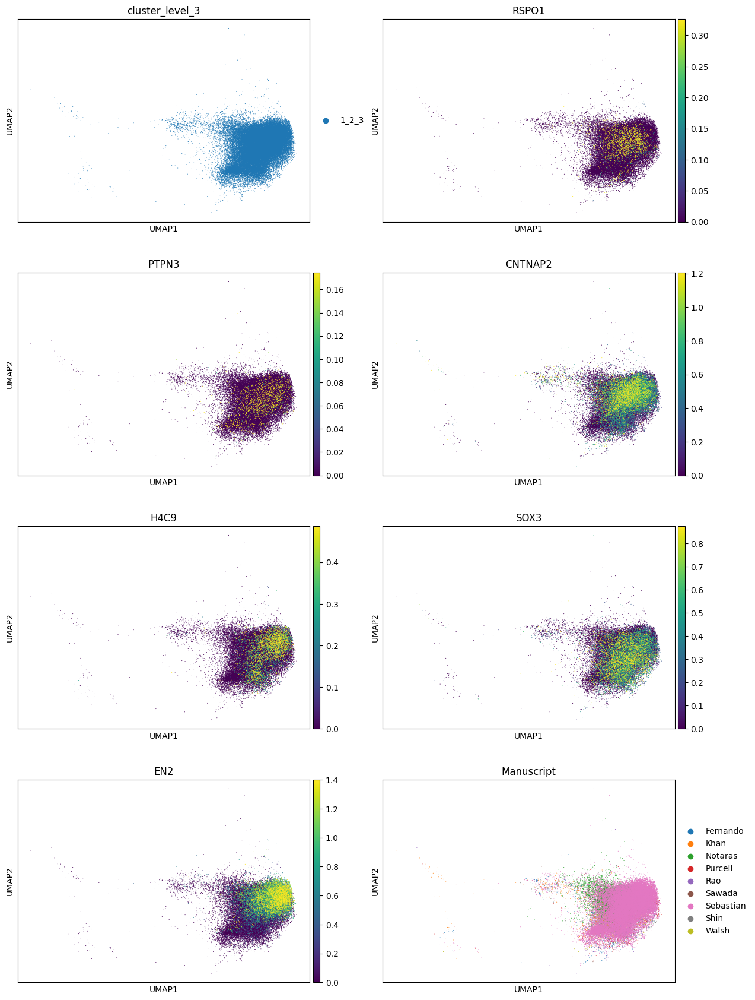

In [31]:
## Examine Subset of Genes in a Class ##
## Subtype ##

sc.pl.umap(adata[adata.obs['subtypes_remerged'] == '1_2_3'],
           color='''cluster_level_3 RSPO1 PTPN3 CNTNAP2 H4C9 SOX3 EN2 Manuscript'''.split(' '),
           layer='log1p_norm', vmax='p97', ncols=2)

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


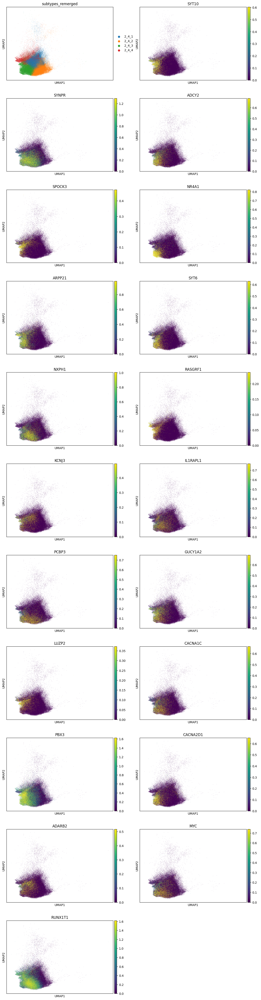

In [32]:
## Examine Top Expression DGEs In A Subtype ##

subtype_cluster = '2_4_3'

sc.pl.umap(adata[adata.obs['cluster_level_2'] == "_".join(subtype_cluster.split('_')[0:2])],
           color=(['subtypes_remerged'] + subtypes_dges[subtypes_dges['subtype'] == subtype_cluster].sort_values(by='logFC', 
                                                                                               ascending=False)[0:20].index.tolist()),
           layer='log1p_norm', vmax='p97', ncols=2)

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


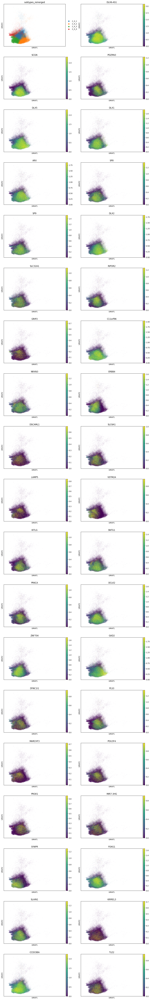

In [33]:
## Intersection of Top Specificity Genes with Highest Expression Genes ##
## Subclass ##

largest = 100

subtype_cluster = '2_4_1'
subclass_num = "_".join(subtype_cluster.split('_')[0:2])

most_specific = subtype_cts[f'X{subtype_cluster}'].nlargest(largest).index 
    
sc.pl.umap(adata[adata.obs['cluster_level_2'] == subclass_num],
           color=['subtypes_remerged'] + most_specific[most_specific.isin(subclass_dges[subclass_dges['subclass'] ==  subclass_num][0:largest].index)].tolist(),
           layer='log1p_norm', vmax='p97', ncols=2)

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


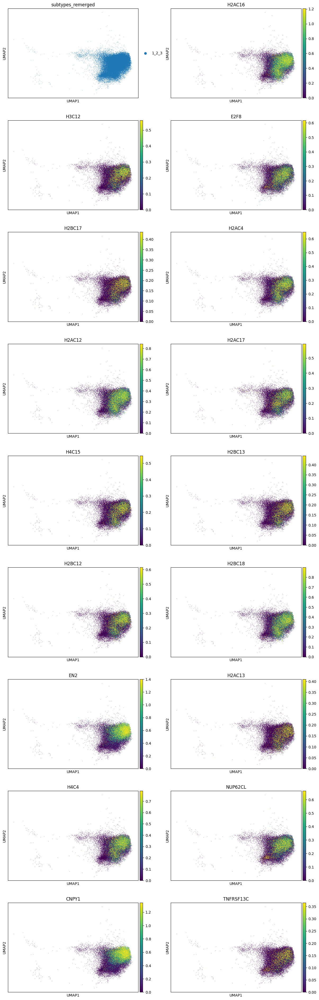

In [34]:
## Intersection of Top Specificity Genes with Highest Expression Genes ##
## Subtype ##

largest = 100

subtype_cluster = '1_2_3'
subclass_num = "_".join(subtype_cluster.split('_')[0:2])

most_specific = subtype_cts[f'X{subtype_cluster}'].nlargest(largest).index 
    
sc.pl.umap(adata[adata.obs['subtypes_remerged'] == subtype_cluster],
           color=['subtypes_remerged'] + most_specific[most_specific.isin(subtypes_dges[subtypes_dges['subtype'] == subtype_cluster][0:100].index)].tolist(),
           layer='log1p_norm', vmax='p97', ncols=2)

In [35]:
most_specific[most_specific.isin(subtypes_dges[subtypes_dges['subtype'] ==  '1_2_3'].index[0:100])].tolist()

['H2AC16',
 'H3C12',
 'E2F8',
 'H2BC17',
 'H2AC4',
 'H2AC12',
 'H2AC17',
 'H4C15',
 'H2BC13',
 'H2BC12',
 'H2BC18',
 'EN2',
 'H2AC13',
 'H4C4',
 'NUP62CL',
 'CNPY1',
 'TNFRSF13C']

In [36]:
adata[adata.obs['subtypes_remerged'] == '1_5'].obs['Pred_Celltype'].value_counts()

Pred_Celltype
MC                     559
Hypothalamic NPC       221
Medulla NPC             53
NC Derivatives          16
Neuroepithelium          6
Astrocyte                1
CP                       1
Pons Neuron NT-GABA      1
Name: count, dtype: int64

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


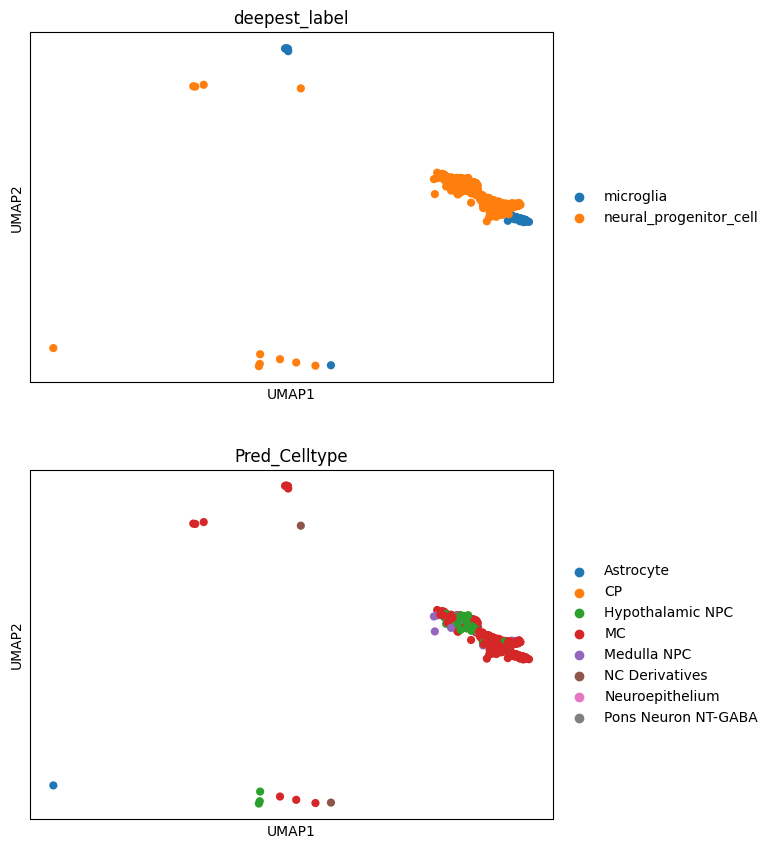

In [37]:
sc.pl.umap(adata[adata.obs['subtypes_remerged'] == '1_5'], color=['deepest_label', 'Pred_Celltype'], 
           layer='log1p_norm', ncols=1)

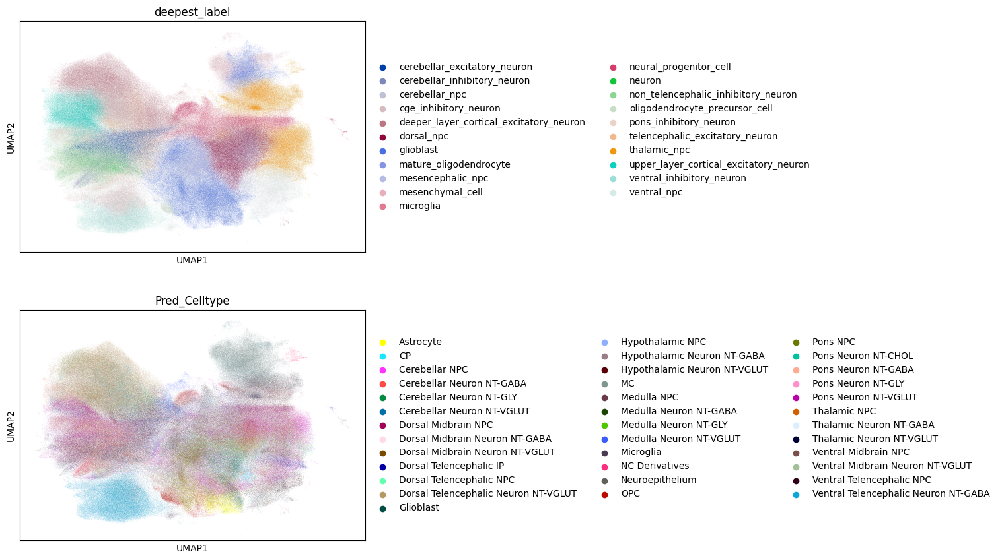

In [38]:
sc.pl.umap(adata, color=['deepest_label', 'Pred_Celltype'], 
           layer='log1p_norm', ncols=1)

In [39]:
## Write Doubleted Annotated ##

adata.write_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/integrated_adata_annotated.h5ad')